# Computer Vision and Image Processing - Lab Session 3

Content:
1. Camera Calibration

Contacts:

- Prof: Giuseppe Lisanti  (giuseppe.lisanti@unibo.it)
- Prof: Samuele Salti  (samuele.salti@unibo.it)
- Tutor: Adriano Cardace (adriano.cardace2@unibo.it)

Course:

- Website and notebooks will be available at https://virtuale.unibo.it

**Camera calibration** is the process whereby all **parameters** defining the camera model are estimated for a specific camera device.

The **pinhole camera model** is represented by the **Perspective Projection Matrix (PPM)**, which in turn can be decomposed into 3 independent tokens: **intrinsic parameter matrix ($A$), rotation matrix ($R$) and translation vector ($T$)**. Depending on the application, either the PPM only or also its independent components ($A, R, T$) need to be estimated.

Many camera calibration algorithms do exist. The basic process, though, relies always on setting up a linear system of equations given a set of **known 3D-2D correspondences**, so as to then solve for the unknown camera parameters.

To obtain the required correspondences specific physical objects (referred to as **calibration targets**) having easily detectable features (such as e.g. **chessboard** or dot patterns) are typically deployed.

## Pinhole camera model

The general form of the Perspective Projection Matrix  (PPM or P) can be thought of as encoding the position of the camera wrt the world into G, the perspective projection carried out by a pinhole camera into the canonical $PPM [I|0]$ and, finally, the actual characteristics of the sensing device into $A$.

<p style="text-align: center"> $A[I│0]G$ or $P=A[R│T]$ </p>

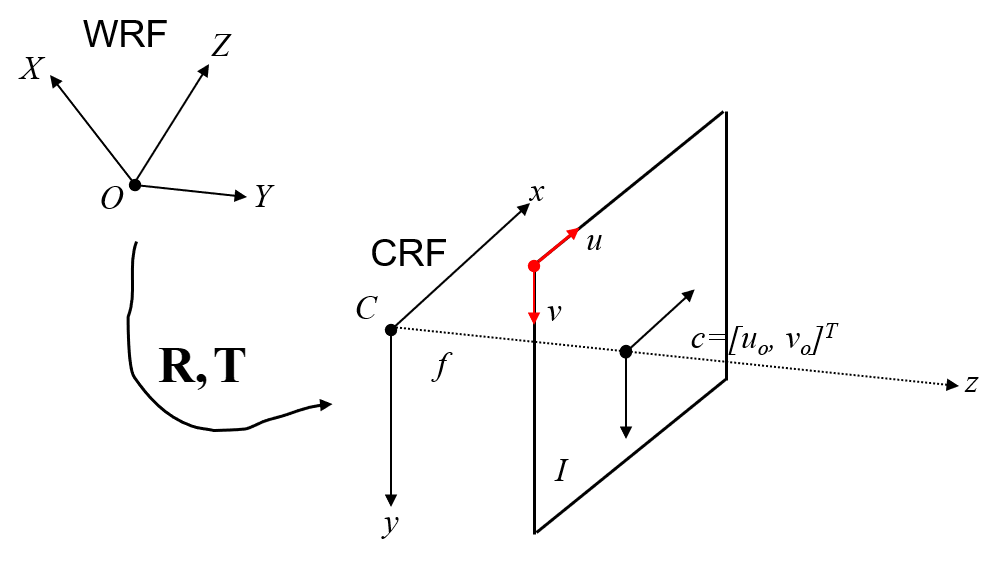

## Intrisics Parameters

Matrix A, which models the characteristics of the image sensing device, is called **Intrinsic Parameter Matrix**. 

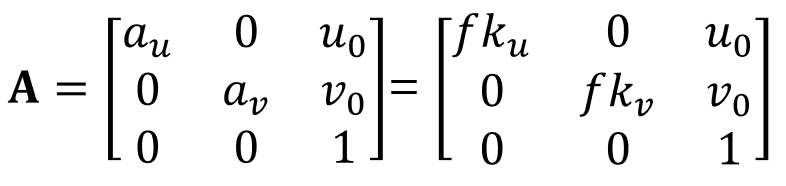

where:

* $f$ is the **focal length** of the pinhole system
* $k_u = \frac{1}{\delta u}$ , $ k_v = \frac{1}{\delta v} $ are, respectively, the inverse of the **horizontal and vertical pixel size**
* $u_0$, $v_0$ are the coordinates of the **piercing point** wrt the top-left corner

**Intrinsic parameters are 5** but can be **reduced** in number by setting $a_u = f*k_u$, $ a_v = f*k_v$ such quantities representing, respectively, the focal length expressed in horizontal and vertical pixel size. 

**The number of intrinsic parameters estimated by OpenCV is thus 4**. The pixel size is usually provided in the camera datasheet: if it is known, the metric focal length can be recovered.

## Extrinsics Parameters

Matrix G, which encodes the position and orientation of the camera withresect to the WRF, is called Extrinsic Parameter Matrix.

* As a **rotation matrix** **(3x3=9 entries)** has indeed only **3 independent parameters (DOF)**, which correspond to the **rotation angles** around the axis of the RF, the **total number of extrinsic parameter is 6** (**3 translation parameters, 3 rotation parameters**)

* Hence, the general form of the PPM can be thought of as encoding the position of the camera wrt the world into G, the perspective projection carried out by a pinhole camera into the canonical $PPM[I|0]$ and, finally, the actual characteristics of the sensing device into A.

## World Reference Frame

The **World Reference Frame**, to ease the derivation and implementation of calibration routines, is assumed **attached with the chessboard**. Therefore, **different calibration images lead to different World Reference Frames**.
In other words, you can actually doing your calibration by **moving the chessboard** (as depicted on the left picture), but the software sees those transformations as if you were **moving the camera** (as depicted on the right picture).

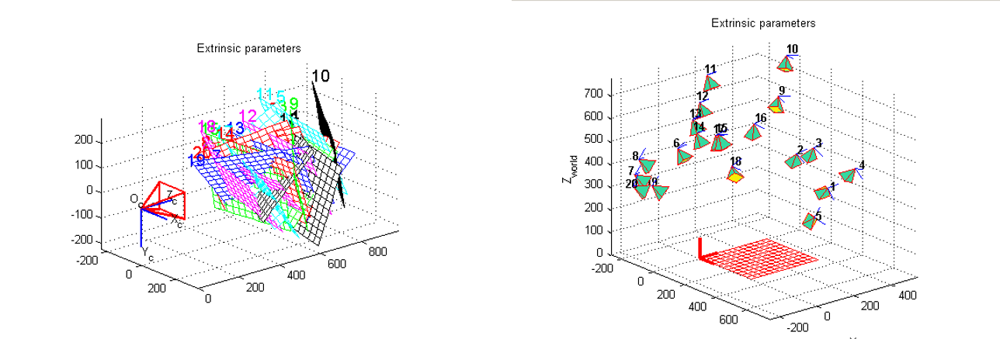

**Of course you can also move the camera to acquire the various calibration images.**

The position of the origin of the WRF on the chessboard is arbitrary, and different packages define it differently.

If we are using an **unambiguous chessboard**, the WRF can at least be defined univocally.

For instance, OpenCV > 2.2 places it so that:
* the **origin** lays on the **first row or column starting and ending with black squares**
* the resulting **z axis** in a **right-handed** reference frame **points away from the camera**.

We can find two possible origins in the unambiguous pattern below (red and yellow points):

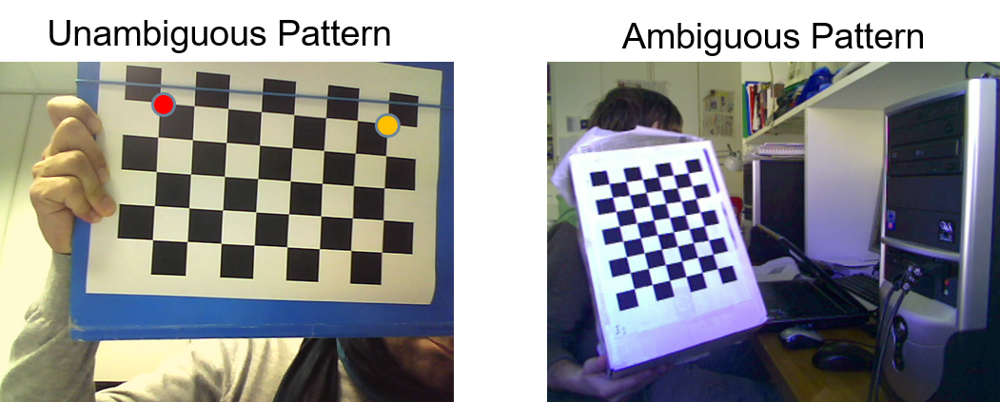

**We have to know the chessboard width and height**.

Depending on what we choose as origin the chessboard can be specified to the software as 8(width) times 5(height) squares, or viceversa as depticted in the image below. 

Choosen the width and height of the pattern and given that the z axis has to form a right handed reference frame with the others, for each origin we obtain only one possibile direction of x and y axis.

The **x and y axes direction** are **fixed by the chessboard definition**.
* **x axis** lays along the **“width”** of the chessboard
* **y axis** along the **“height”** of the chessboard

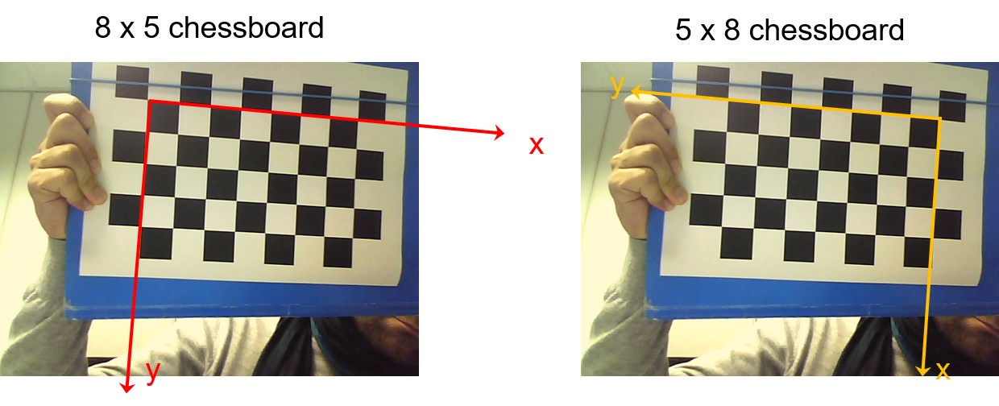
Note that, in OpenCV to define the chessboard we use **the number of internal corners**.

Implementing a camera calibration software requires a significant effort. However, the main Computer Vision toolbox include specific functions (OpenCV, Matlab CC Toolbox, Halcon.) 

## Zhang Method for Calibration
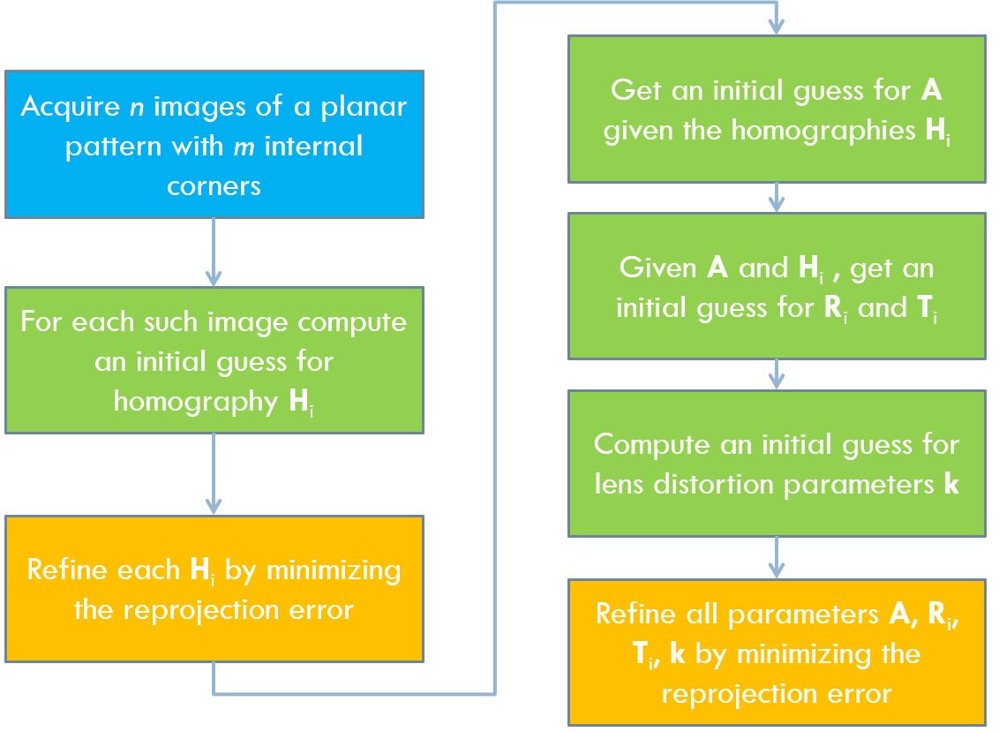

## Implementing **Camera Calibration** with *OpenCV*

First of all let us import the usual libraries:

In [1]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

## Acquiring the calibration images

The **minimum** number of images to calibrate a camera is __3__. A rule of thumb is to take **at least 12** pictures because it is possible that you will not be able to detect the chessboard in all of them and it will make calibration results more robusts.

Moreover, try to take both pictures with **several rotations of the chessboard**.

When you acquired the pictures save them on your computer in a known folder.

Let us create a list of the paths to all the calibration images. (**The path to the images you have just taken if you want to calibrate your own camera** or you can use the pictures contained inside *"chessboards"*).

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [10]:
!cp -r /content/drive/MyDrive/chessboards ./

In [163]:
!ls

chessboards  drive  Lab3_images.zip  sample_data


In [164]:
!unzip Lab3_images.zip
!unzip chessboards.zip

Archive:  Lab3_images.zip
  inflating: chessboards.zip         
  inflating: __MACOSX/._chessboards.zip  
   creating: es2/
  inflating: es2/pen.jpg             
  inflating: __MACOSX/es2/._pen.jpg  
   creating: es3/
  inflating: es3/.DS_Store           
  inflating: __MACOSX/es3/._.DS_Store  
  inflating: es3/chessboard.jpg      
  inflating: __MACOSX/es3/._chessboard.jpg  
  inflating: es3/stregatto.jpg       
  inflating: __MACOSX/es3/._stregatto.jpg  
Archive:  chessboards.zip
  inflating: chessboards/8.jpg       
  inflating: chessboards/9.jpg       
  inflating: chessboards/12.jpg      
  inflating: chessboards/11.jpg      
  inflating: chessboards/10.jpg      
  inflating: chessboards/4.jpg       
  inflating: chessboards/5.jpg       
  inflating: chessboards/7.jpg       
  inflating: chessboards/6.jpg       
  inflating: chessboards/2.jpg       
  inflating: chessboards/3.jpg       
  inflating: chessboards/1.jpg       
  inflating: chessboards/0.jpg       


In [85]:
dirname = "chessboards/chessboards"
img_names = [dirname + str(i) + ".jpg" for i in range(11)]
print(img_names)

['chessboards/chessboards0.jpg', 'chessboards/chessboards1.jpg', 'chessboards/chessboards2.jpg', 'chessboards/chessboards3.jpg', 'chessboards/chessboards4.jpg', 'chessboards/chessboards5.jpg', 'chessboards/chessboards6.jpg', 'chessboards/chessboards7.jpg', 'chessboards/chessboards8.jpg', 'chessboards/chessboards9.jpg', 'chessboards/chessboards10.jpg']


## Finding 2D-3D correspondeces

First of all we need to perform the first step of Zhang method. Finding all 2D-3D correspondeces between corner 2D position in the image and 3D world coordinates.

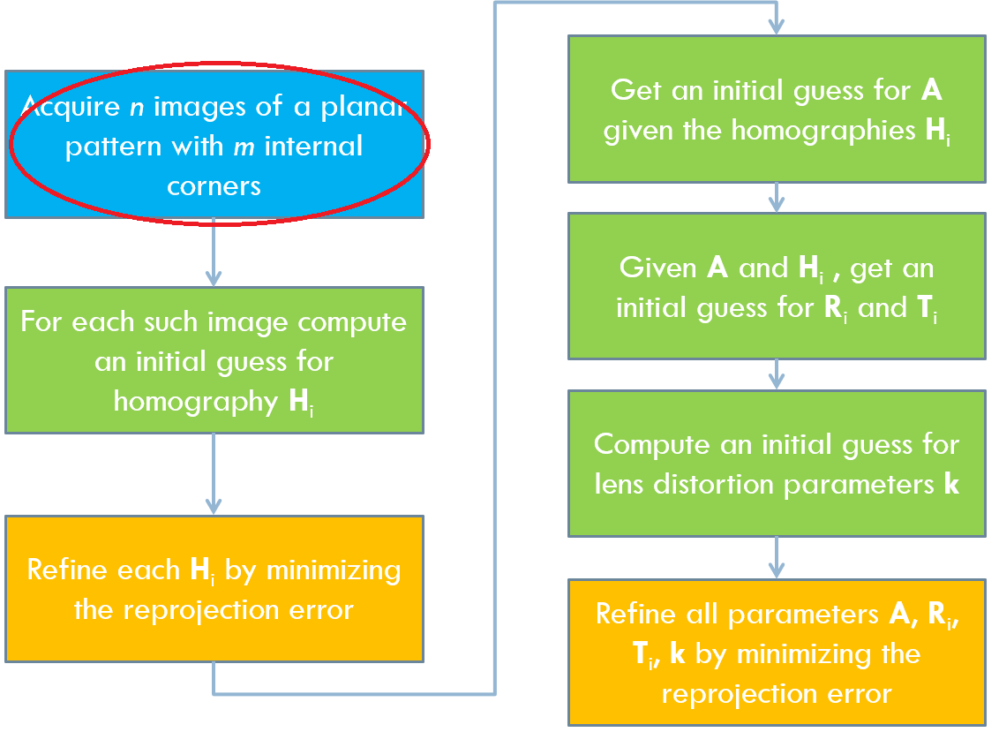

### 2D Coordinates

To find the correspondences we need to detect the corners of the chessboard image.

Let us first load a sample image to understand how to detect corners. It needs to be loaded **GRAYSCALE**:

In [83]:
img = cv2.imread("chessboards/chessboards1.jpg",cv2.IMREAD_GRAYSCALE)

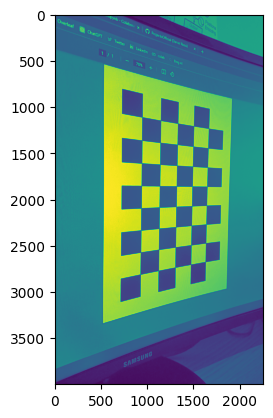

In [84]:
plt.imshow(img)


Then count the number of **inner corner** per column and row of the calibration target (chessboard). We will call it *pattern_size*:

In [41]:
pattern_size = (8,5) # number of inner corner, (columns, rows) for OpenCV

We can use **cv2.findChessboardCorners(img, pattern_size)** to detect corner in an image. 

The functions will return a boolean value **found** and the list of the **corners** 2D coordinate in the image. **found** will be true if and only if all the 8x5 (40) corners will be detected in the image. If the image is too dark or too bright the algorithm may fail to detect corners and **found** would be false. 

**N.B** If you pass the wrong pattern_size the method will be really slow leading to a **found=False** result.

In [42]:
found, corners = cv2.findChessboardCorners(img, pattern_size)
print("Found: " , found)
print("2D image coordinate of corners: ", corners)

Found:  True
2D image coordinate of corners:  [[[ 924.443   2816.531  ]]

 [[ 929.1825  2577.301  ]]

 [[ 929.3172  2338.9338 ]]

 [[ 932.128   2101.8433 ]]

 [[ 937.7494  1860.585  ]]

 [[ 940.5163  1614.2704 ]]

 [[ 942.88525 1369.7067 ]]

 [[ 942.4341  1118.5446 ]]

 [[1120.9237  2775.167  ]]

 [[1122.0562  2547.8057 ]]

 [[1127.4073  2319.7915 ]]

 [[1128.9402  2090.5654 ]]

 [[1134.5078  1860.2158 ]]

 [[1135.3644  1627.3914 ]]

 [[1141.7333  1392.0996 ]]

 [[1142.5283  1152.3914 ]]

 [[1301.1165  2741.6091 ]]

 [[1302.0319  2523.7605 ]]

 [[1306.7924  2303.232  ]]

 [[1310.2241  2085.7605 ]]

 [[1314.2935  1862.2848 ]]

 [[1319.1378  1640.5685 ]]

 [[1323.0858  1413.1672 ]]

 [[1329.272   1184.4578 ]]

 [[1468.4552  2709.5227 ]]

 [[1471.3961  2498.5806 ]]

 [[1475.9215  2289.4497 ]]

 [[1479.4022  2077.2415 ]]

 [[1484.977   1865.4238 ]]

 [[1490.8077  1652.5542 ]]

 [[1494.8483  1434.4227 ]]

 [[1498.9402  1213.2797 ]]

 [[1626.6294  2681.1833 ]]

 [[1629.2756  2479.61   ]]

 [

Even if we **found** the 2D positions of corners, they might not be accurate. 

To refine the results we can call **cv2.cornerSubPix**. 

See in OpenCV [documentation](https://docs.opencv.org/2.4/modules/imgproc/doc/feature_detection.html?highlight=cornersubpix#cornersubpix*documentation.) for more detail about this function.

In [43]:
# Do cornerSubPix only if chessboard found is True
if found:
    #Refining corner position to subpixel iteratively until criteria max_count=30 or criteria_eps_error=1 is sutisfied
    term = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_COUNT, 30, 1)
    #Image Corners 
    cv2.cornerSubPix(img, corners, (5, 5), (-1, -1), term)

Let us visualize the founded corners. Follow **from red to blu** lines to go from (0,0) to (8,5) corner:

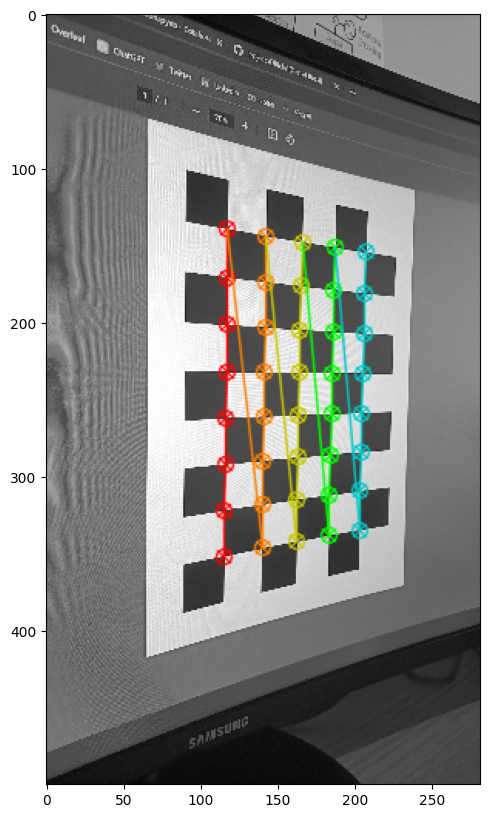

In [44]:
vis = cv2.cvtColor(cv2.resize(img, (img.shape[1]//8, img.shape[0]//8)), cv2.COLOR_GRAY2BGR)
cv2.drawChessboardCorners(vis, pattern_size, corners//8, found)
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
plt.show()

In [45]:
corners.shape

(40, 1, 2)

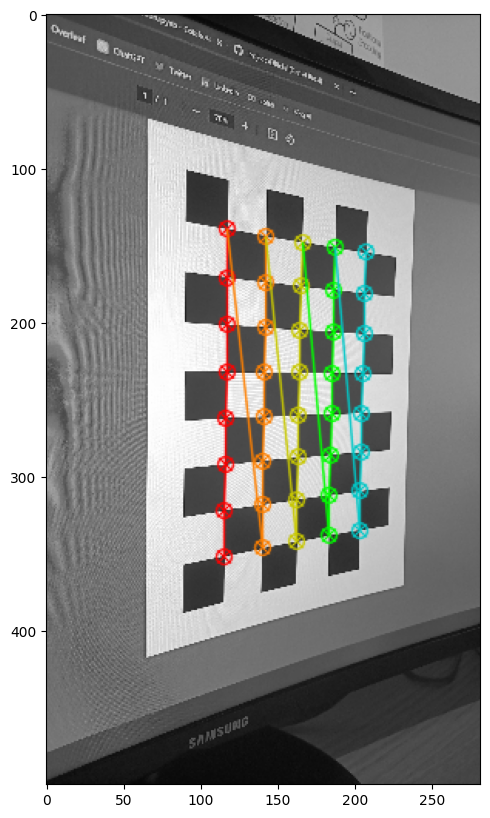

In [49]:
img_vis = cv2.imread('chessboards0.jpg')
img_vis = cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)
cv2.circle(img_vis, (int(corners[1][0][0]), int(corners[1][0][1])), 100, (255,0,0), 20)
plt.figure(figsize=(10, 10))
plt.imshow(img_vis)
plt.show()

### 3D Coordinates

We need to measure the size of the square (measure it direcly using a ruler on the printed chessboard) to know the 3D coordinates of the points:

In [52]:
square_size = 23 #mm

Let us create the 3D coordinate for each corner of the chessboard. 

We know that 3D coordinates of a corner $c_{i,j}$ will be *i x square_size* and *j x square_size* where $i\in{1..5} ,j\in{1..8}$ are the row and column indexes of the corner in the pattern grid. 

The total number of corner is *rows x columns* of the pattern size.

To build the $i,j$ coordinate for each point in the grid is really useful the numpy method *np.indices(shape)* which returns an array containing its 2D indices:

In [53]:
indices = np.indices(pattern_size, dtype=np.float32)
print("Shape of indices: " , indices.shape)
# print(indices)

Shape of indices:  (2, 8, 5)


**N.B** we need it in **float** type because later we will need to multiply it with float numbers.

Let us see for instance the x and y indices of the position 0, 2 in the grid:

In [54]:
print(indices[:, 0, 2])

[0. 2.]


(0, 2) of course!

Since we know that the distance between the corners is exactly 26.5mm (square_size), we have to multiply these indices by square_size to get the real 3D x,y coordinates:

In [55]:
indices *= square_size
print(indices)

[[[  0.   0.   0.   0.   0.]
  [ 23.  23.  23.  23.  23.]
  [ 46.  46.  46.  46.  46.]
  [ 69.  69.  69.  69.  69.]
  [ 92.  92.  92.  92.  92.]
  [115. 115. 115. 115. 115.]
  [138. 138. 138. 138. 138.]
  [161. 161. 161. 161. 161.]]

 [[  0.  23.  46.  69.  92.]
  [  0.  23.  46.  69.  92.]
  [  0.  23.  46.  69.  92.]
  [  0.  23.  46.  69.  92.]
  [  0.  23.  46.  69.  92.]
  [  0.  23.  46.  69.  92.]
  [  0.  23.  46.  69.  92.]
  [  0.  23.  46.  69.  92.]]]


[link text](https:// [link text](https://))We got the x,y coordinates of each corner in the world reference system ! (assumed that the first is in position (0mm,0mm)). For instance let us try to print again the 0,2 corner position:

In [56]:
print(indices[:, 0, 2])

[ 0. 46.]


The corner $c_{0, 2}$ is in position **(0.0mm, 53.0mm)** in the world!

However, there are two problems to fix:

First, we need a list of 3D-2D pairs. Since 2D points are expressed by OpenCV convention (x, y), we need to do the same for the 3D points. 
Thus, we have to rearrange the 3D points by transposing the axis, the original shape __(2,8,5)__ has to first become a **(5,8,2)**. 

In [57]:
coords_3D = np.transpose(indices, [2, 1, 0])
print("Transpose shape: " , coords_3D.shape)

Transpose shape:  (5, 8, 2)


Then, since we want a list of points, we need to reshape it to (40,2):

In [58]:
coords_3D = coords_3D.reshape(-1, 2)
print(coords_3D.shape)

(40, 2)


In [59]:
coords_3D[:10]

array([[  0.,   0.],
       [ 23.,   0.],
       [ 46.,   0.],
       [ 69.,   0.],
       [ 92.,   0.],
       [115.,   0.],
       [138.,   0.],
       [161.,   0.],
       [  0.,  23.],
       [ 23.,  23.]], dtype=float32)

Then, during the camera calibration we assume that all the pixels belonging to the chessboard lie in the same plane with z=0. Thus, the x,y,z coordinate of corner $c_{0, 2}$ are (0, 53, 0). However, indices contains only the x and y coordinates, so we need to concatenate the third axis, z, composed of all zeros.

In [60]:
pattern_points = np.concatenate([coords_3D, np.zeros([coords_3D.shape[0], 1], dtype=np.float32)], axis=-1)

Let us try to print the resulting arrays:

In [61]:
for idx, p in enumerate(pattern_points):
    print(idx, p)

0 [0. 0. 0.]
1 [23.  0.  0.]
2 [46.  0.  0.]
3 [69.  0.  0.]
4 [92.  0.  0.]
5 [115.   0.   0.]
6 [138.   0.   0.]
7 [161.   0.   0.]
8 [ 0. 23.  0.]
9 [23. 23.  0.]
10 [46. 23.  0.]
11 [69. 23.  0.]
12 [92. 23.  0.]
13 [115.  23.   0.]
14 [138.  23.   0.]
15 [161.  23.   0.]
16 [ 0. 46.  0.]
17 [23. 46.  0.]
18 [46. 46.  0.]
19 [69. 46.  0.]
20 [92. 46.  0.]
21 [115.  46.   0.]
22 [138.  46.   0.]
23 [161.  46.   0.]
24 [ 0. 69.  0.]
25 [23. 69.  0.]
26 [46. 69.  0.]
27 [69. 69.  0.]
28 [92. 69.  0.]
29 [115.  69.   0.]
30 [138.  69.   0.]
31 [161.  69.   0.]
32 [ 0. 92.  0.]
33 [23. 92.  0.]
34 [46. 92.  0.]
35 [69. 92.  0.]
36 [92. 92.  0.]
37 [115.  92.   0.]
38 [138.  92.   0.]
39 [161.  92.   0.]


## Repeat the process for each image
When we calibrate a camera we need to repeat this operation on all calibration images so I will define a function to process images which return the pairs of (2D,3D) points:

In [92]:
def processImage(fn):
    print('processing {}'.format(fn))
    img = cv2.imread(fn, cv2.IMREAD_GRAYSCALE)
    # Check image loaded correctly
    if img is None:
        print("Failed to load", fn)
        return None
    # Finding corners
    found, corners = cv2.findChessboardCorners(img, pattern_size)
    if found:
        # Refining corner position
        term = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_COUNT, 5, 1)
        cv2.cornerSubPix(img, corners, (5, 5), (-1, -1), term)
        # Visualize detected corners
        vis = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        cv2.drawChessboardCorners(vis, pattern_size, corners, found)
        plt.figure(figsize=(20,10))
        plt.imshow(vis)
        plt.show()
    else:
        print('chessboard not found')
        return None
    print('           %s... OK' % fn)
    return corners.reshape(-1, 2)

We then process each chessboard image we acquired previously:

processing chessboards/chessboards0.jpg


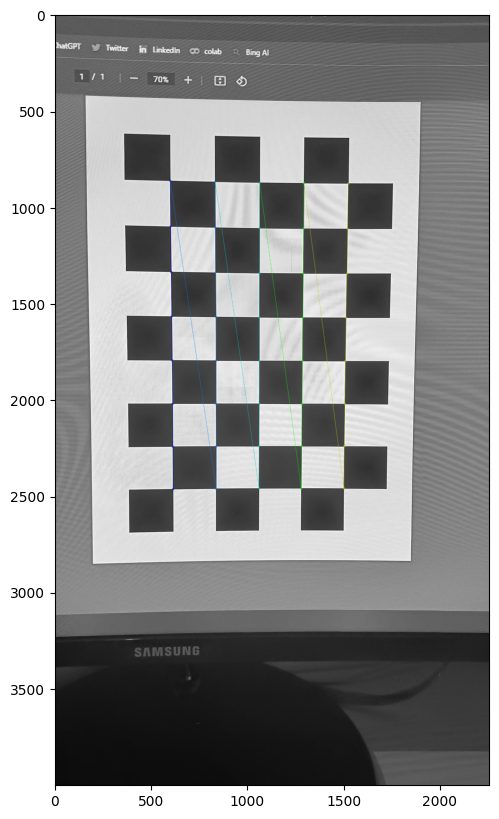

           chessboards/chessboards0.jpg... OK
processing chessboards/chessboards1.jpg


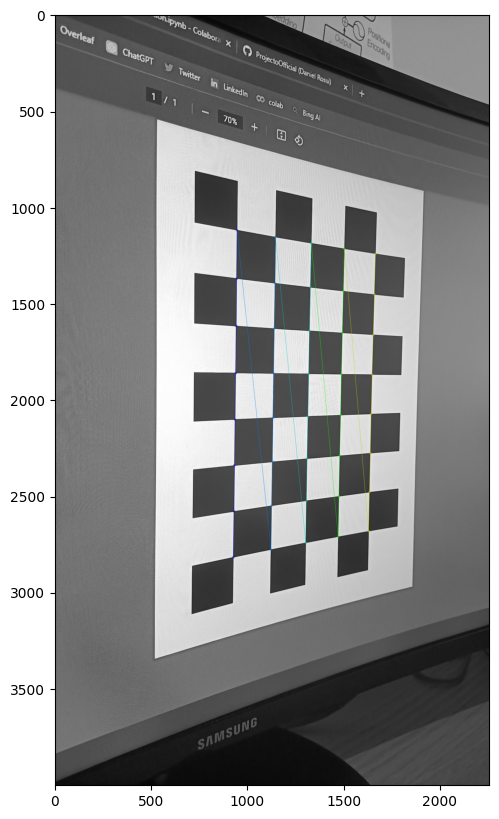

           chessboards/chessboards1.jpg... OK
processing chessboards/chessboards2.jpg


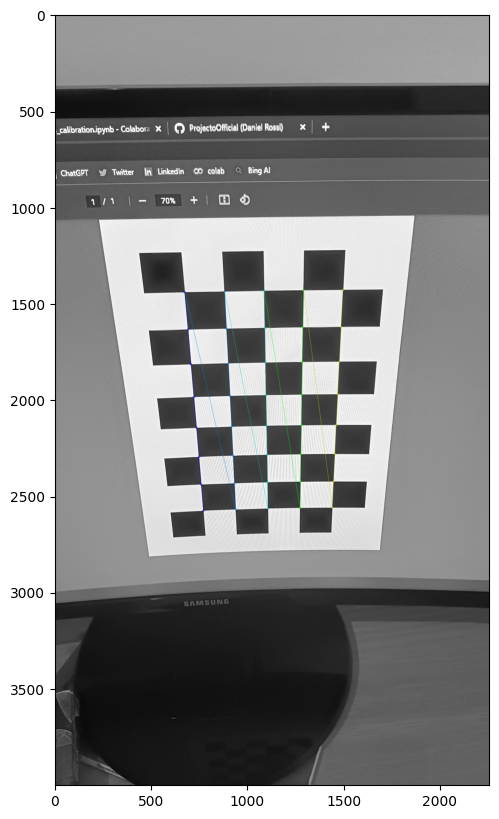

           chessboards/chessboards2.jpg... OK
processing chessboards/chessboards3.jpg


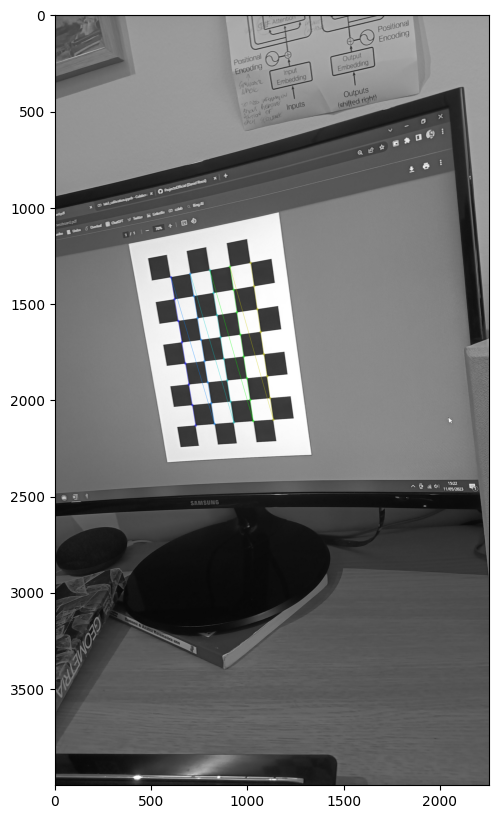

           chessboards/chessboards3.jpg... OK
processing chessboards/chessboards4.jpg


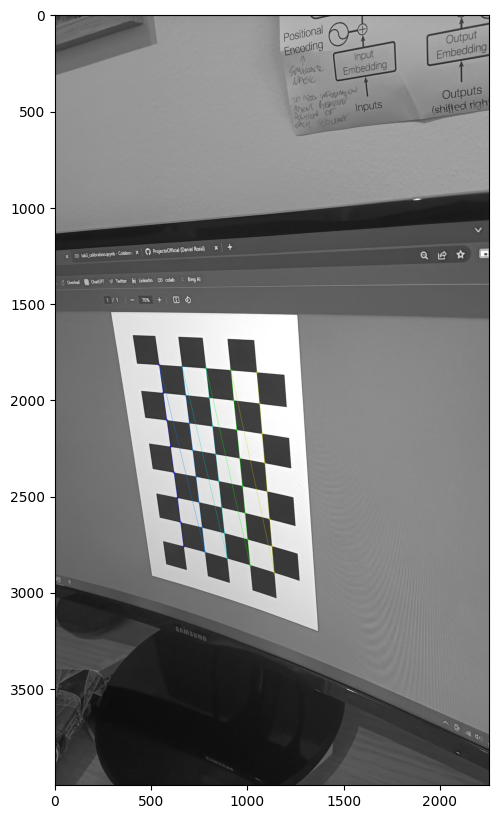

           chessboards/chessboards4.jpg... OK
processing chessboards/chessboards5.jpg


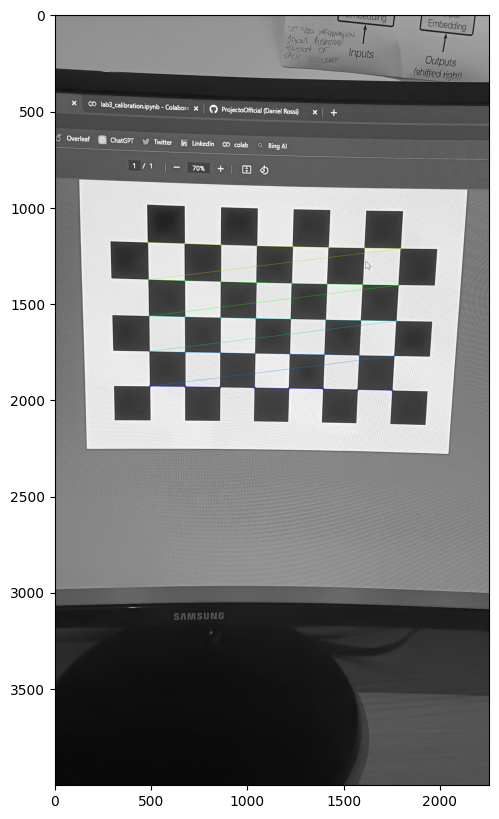

           chessboards/chessboards5.jpg... OK
processing chessboards/chessboards6.jpg


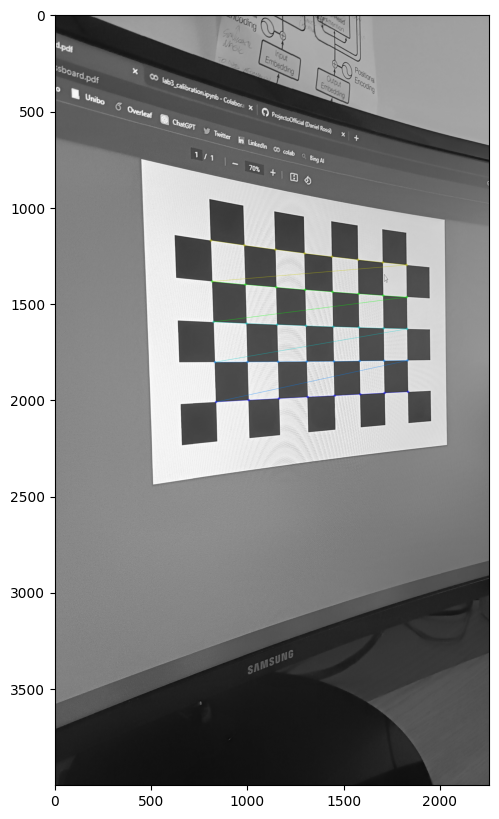

           chessboards/chessboards6.jpg... OK
processing chessboards/chessboards7.jpg


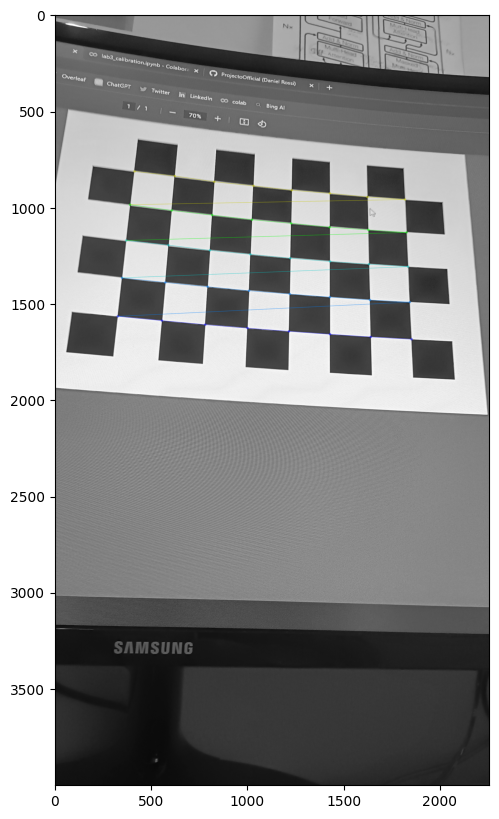

           chessboards/chessboards7.jpg... OK
processing chessboards/chessboards8.jpg


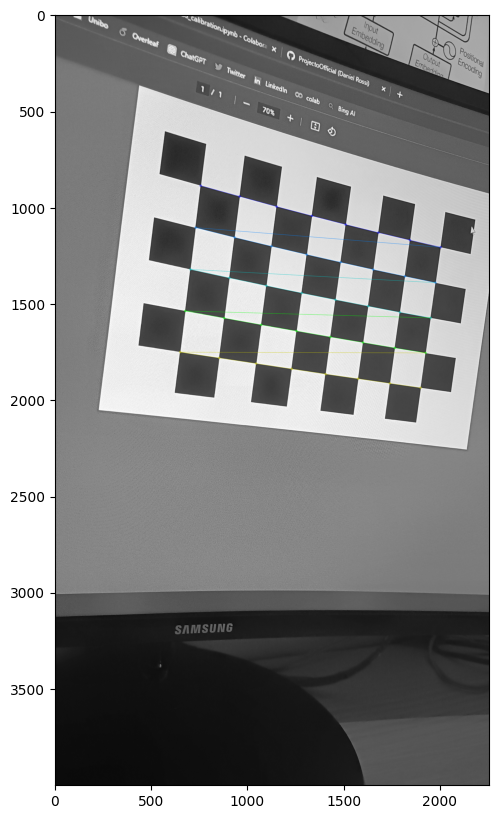

           chessboards/chessboards8.jpg... OK
processing chessboards/chessboards9.jpg


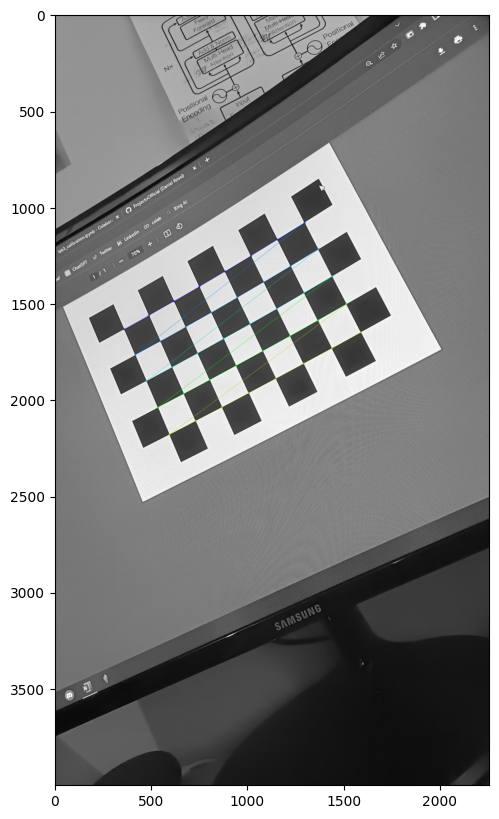

           chessboards/chessboards9.jpg... OK
processing chessboards/chessboards10.jpg


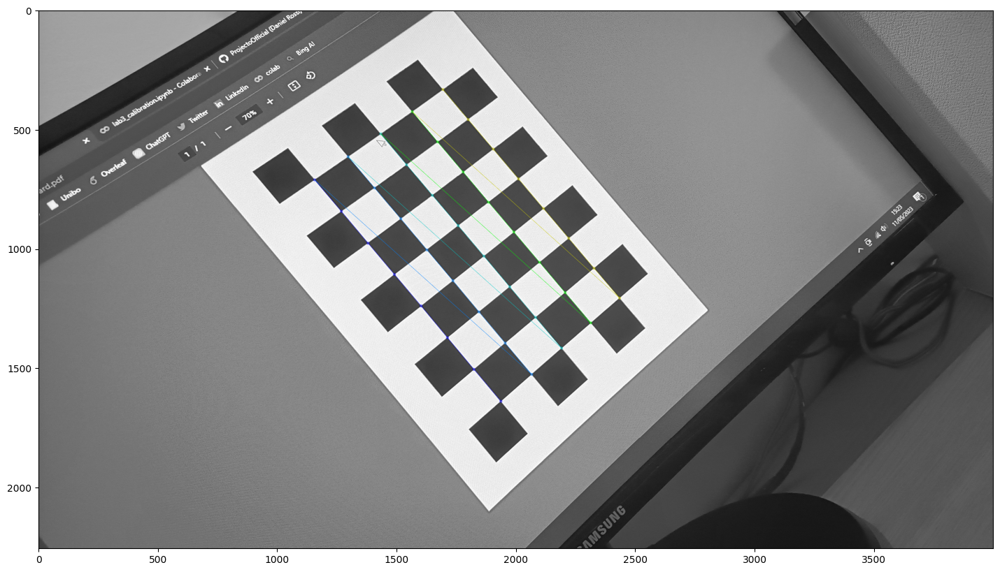

           chessboards/chessboards10.jpg... OK


In [93]:
chessboards = [processImage(fn) for fn in img_names]

And we filter out images where we could not detect all 40 corners:

In [98]:
chessboards = [x for x in chessboards if x is not None]
len(chessboards)

11

## Building Correspondences
We add to two lists each 2D and 3D points respectively building the set of 2D-3D correspondeces used during calibration process:

In [99]:
# Creating the lists of 2D and 3D points 
obj_points = [] #3D points
img_points = [] #2D points

for corners in chessboards:
        img_points.append(corners)
        obj_points.append(pattern_points)

## Calibrate Camera

Now that we got all 3D points (obj_points) and their corresponding 2D points (img_points) we can calibrate our camera and perform all other Zhang steps:
    
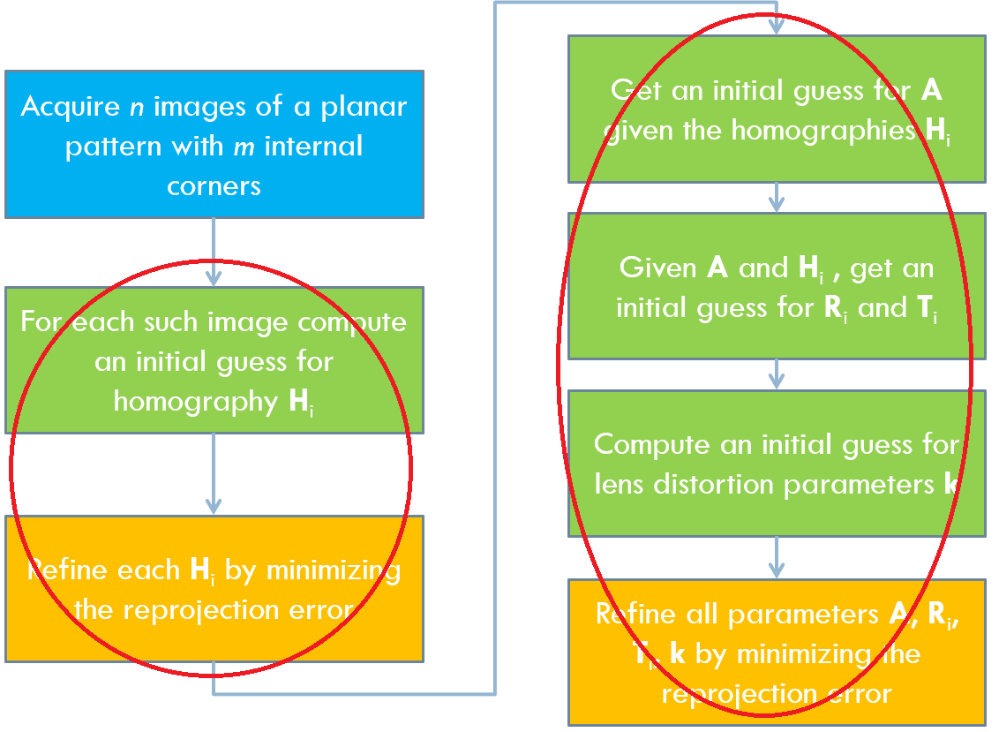
<br>
**READY ???????**

...

...

...

...

...

...

...

...

...

...

...

...

**LUCKY** OpenCV provides a single method to it! (Danger Escaped! :D )

**cv2.calibrateCamera(3D_points, 2D_points, (width,height), None,None)**

This method takes as input the corresponding points and the width and height of the image and it returns all the parameters of the camera:

In [100]:
# Getting the width and height of the images
h, w = cv2.imread(img_names[0], cv2.IMREAD_GRAYSCALE).shape[:2]

# Calibrating Camera
rms, camera_matrix, dist_coefs, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, (w, h), None, None)

print("\nRMS:", rms)
print("camera matrix:\n", camera_matrix)
print("distortion coefficients: ", dist_coefs.ravel())
print("Rotation vectors:", rvecs)
print("translation vectors", tvecs)


RMS: 2.407386093224799
camera matrix:
 [[3.12194168e+03 0.00000000e+00 1.15001964e+03]
 [0.00000000e+00 3.11262425e+03 1.88541607e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
distortion coefficients:  [ 0.29027625 -1.50236171 -0.02194418  0.00765978  2.10631012]
Rotation vectors: (array([[ 0.04800253],
       [-0.02512397],
       [-1.56744415]]), array([[ 0.49258604],
       [-0.46855058],
       [-1.50468438]]), array([[ 0.38363663],
       [ 0.3369744 ],
       [-1.55431917]]), array([[-0.19255362],
       [ 0.38092479],
       [-1.67340831]]), array([[-0.2352701 ],
       [ 0.65053009],
       [-1.51825397]]), array([[ 0.06084454],
       [ 0.16464927],
       [-3.11714031]]), array([[-0.95114173],
       [ 0.01973466],
       [ 2.96953203]]), array([[ 0.20108426],
       [-0.56687225],
       [-3.03717293]]), array([[-0.01414671],
       [-0.37931218],
       [ 0.13571323]]), array([[-0.20054888],
       [ 0.23750001],
       [-0.46692272]]), array([[-6.86759360e-04],
  

We notice that we got several outputs from *cv2.calibrateCamera*. They are respectively:
* RMS (Root Mean Square Error): **Reprojection error in pixel** using the estimated camera parameters. The lower it is the better calibration you obtain. Usually it should be in a range **between 0.1 and 1** in good calibrations. If it is much larger than 1 you did some mistakes during the calibration process.

* camera_matrix: **Intrinsics parameters** of the camera expressed as 3x3 matrix

* dist_coefs: **lens distorsion** coefficents expressed as 1x5 array.

* rvecs: **rotations** of the cameras **for each chessboard image**. It is an array of dimension Nx3 where N are the number of images where you found the chessboard during calibration while 3 are the 3 DOF of the rotations.

* tvecs: **translations** of the cameras **for each chessboard image**. It is an array of dimension Nx3 where N are the number of images where you found the chessboard during calibration while 3 are the coordiante of the 3D translation vectors.

**N.B** If we need the rotation matrix starting from a rotation vector rvec or vice-versa we can use:

**cv2.Rodrigues(rvec)**.

Given a rvec it will return the 3x3 rotation matrix. Let us try with the first element of rvecs found by calibration:

In [101]:
rotation_matrix = cv2.Rodrigues(rvecs[0])[0]
print("R shape: ", rotation_matrix.shape)
print(rotation_matrix)

R shape:  (3, 3)
[[ 0.00335056  0.99891112 -0.04653328]
 [-0.99988932  0.00267206 -0.01463553]
 [-0.01449525  0.04657716  0.99880952]]


So if we need the complete 3x4 extrinsics matrix we need to concatenate the rotation matrix and the traslation vector along axis 1. To do it we can use **np.concatenate(listOfArrays, axis)**

In [102]:
translation_matrix = tvecs[0]
print("T shape", translation_matrix.shape)

extrinsics_matrix = np.concatenate([rotation_matrix,translation_matrix], axis=1)
print("RT shape: ", extrinsics_matrix.shape)

T shape (3, 1)
RT shape:  (3, 4)


## Undistorting images

Now that we know the **lens distorsions** and the **intrisics parameters** we can undistort images.

__Reminder__ There are two main kind of distorsion in lenses:

* **Radial distortion**: lines far from the principal point look distorted. Radial distortion is modeled using the following relationship between the undistorted coordinates  $x_u$  and  $y_u$  and the distorted ones $x$ and $y$:

<p style="text-align: center"> $x_u = x(1+k_1r_2+k_2r_4+k_3r_6)$ </p>
<p style="text-align: center"> $y_u = y(1+k_1r_2+k_2r_4+k_3r_6)$ </p>

**<p style="text-align: center"> Pincushion distorsion: </p>**
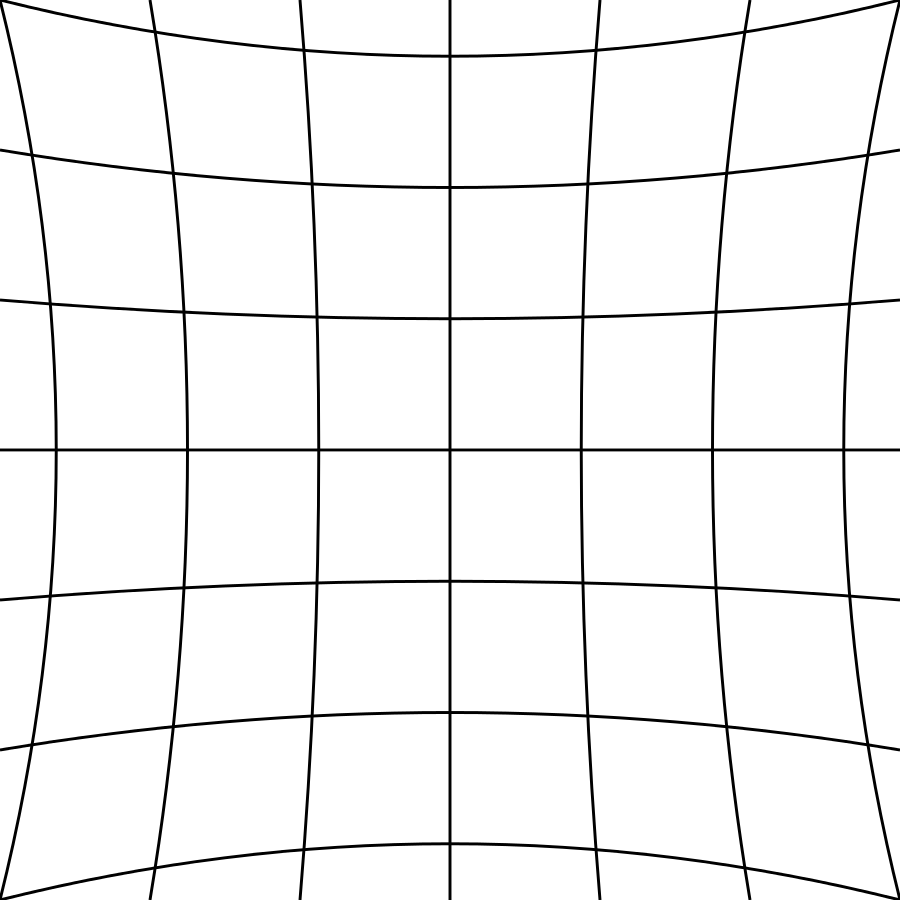
**<p style="text-align: center"> Barrel distorsion: </p>**
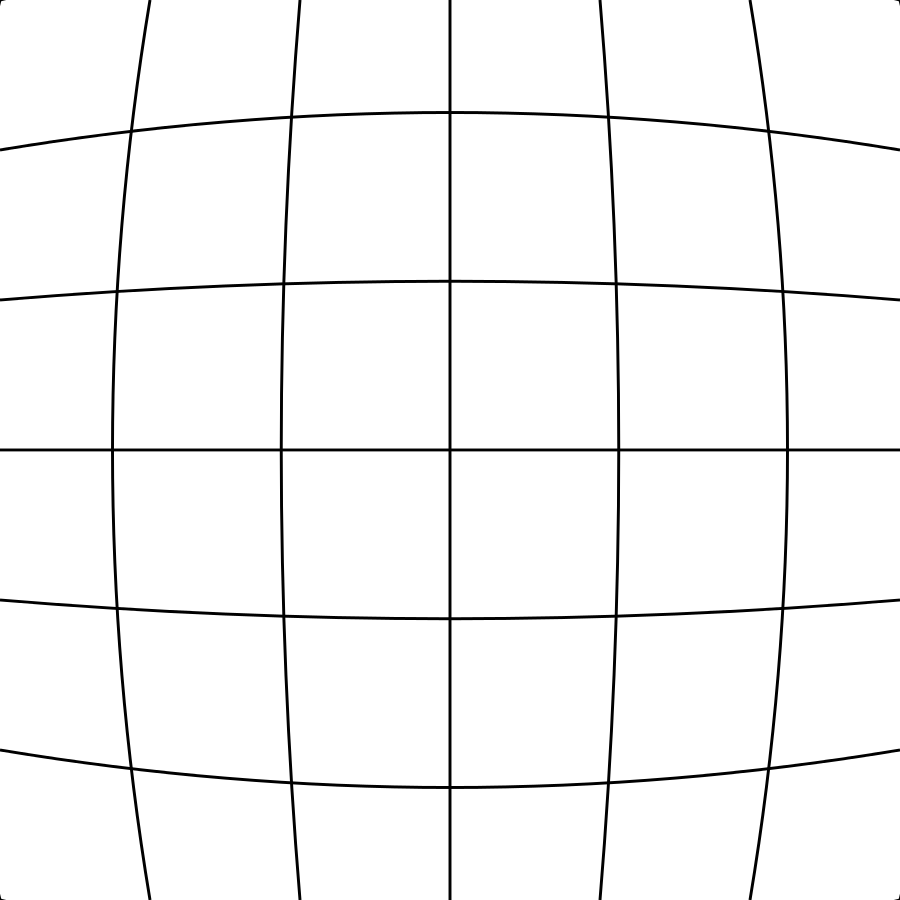
* **Tangential distortion**: occurring becouse the lens is not perfectly parallel to the camera plane.

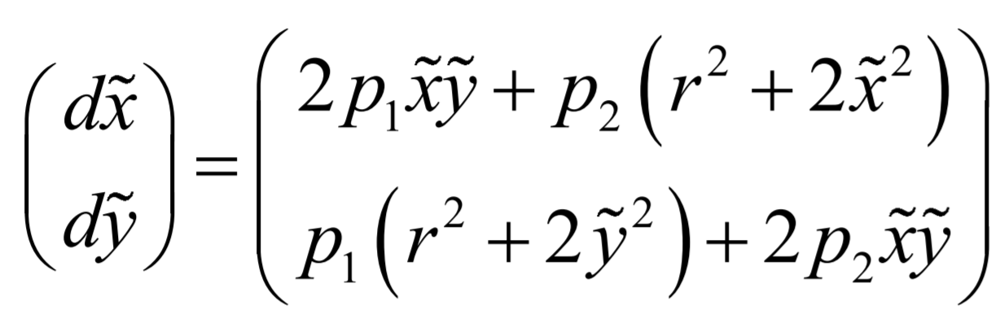
In sum, we need five parameters to model camera distortion:  $[k1,k2,k3,p1,p2]$ , which are the five values returned by the function cv2.calibrateCamera in the dist_coefs variable.

To undistort an image in OpenCV we only need to call **cv2.getOptimalNewCameraMatrix** and finally **cv2.undistort**.

In [103]:
# Finding the new optical camera matrix
newcameramtx, roi = cv2.getOptimalNewCameraMatrix(camera_matrix, dist_coefs, (w, h), 1, (w, h))

We can use **cv2.undistort** to undistort the image

In [110]:
img = cv2.imread("chessboards/chessboards5.jpg")
im_undistorted = cv2.undistort(img, camera_matrix, dist_coefs, None, newcameramtx)

And crop to the ROI:

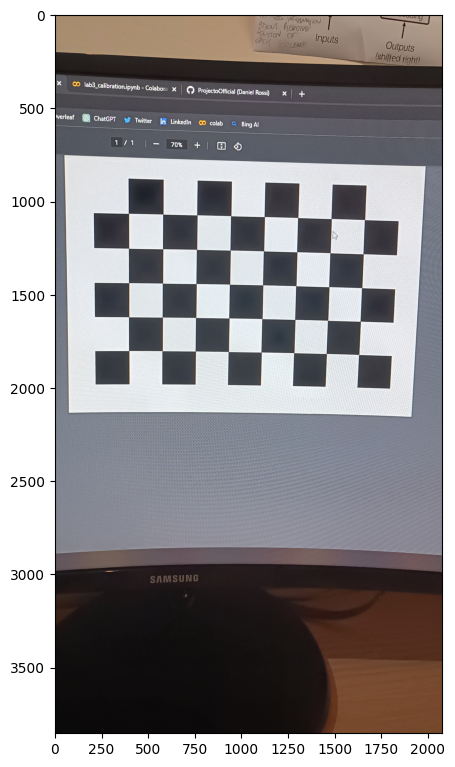

In [126]:
x, y, w_2, h_2 = roi
im_undistorted = im_undistorted[y:y+h_2, x:x+w_2]

plt.figure(figsize=(5,10))
plt.imshow(cv2.cvtColor(im_undistorted, cv2.COLOR_BGR2RGB))
plt.show()

## An example of Applications: Aumegmented Reality

Now that the camera is calibrated for both the extrinsic and intrinsic parameters, we can project points from the 3D world to the 2D image plane. This can be used, for instance, to implement "augmented reality" algorithms which draw 3D objects on the image. Let's see how to draw a cube on the checkerboard. First, define the  8  corners of a cube of side 100:

In [115]:
_3d_corners = np.float32([[0,0,0], [0,100,0], [100,100,0], [100,0,0],
                           [0,0,-100],[0,100,-100],[100,100,-100],[100,0,-100]])

We can project points to the 2D image plane using the function cv2.projectPoints. Since we need to project them on a specific image, we first need to choose one of the considered images:

In [120]:
image_index=4
cube_corners_2d,_ = cv2.projectPoints(_3d_corners,rvecs[image_index],tvecs[image_index],camera_matrix,dist_coefs) 
#the underscore allows to discard the second output parameter (see doc)
cube_corners_2d = np.round(cube_corners_2d).astype(np.int)
print(cube_corners_2d,0) #the output consists in 8 2-dimensional points

[[[ 668 2759]]

 [[1186 2907]]

 [[1131 2281]]

 [[ 594 2193]]

 [[ 211 3079]]

 [[ 765 3306]]

 [[ 663 2587]]

 [[  79 2439]]] 0


<ipython-input-120-fca2448fdf12>:4: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cube_corners_2d = np.round(cube_corners_2d).astype(np.int)


We can now plot limes on the 3D image using the cv2.line function:

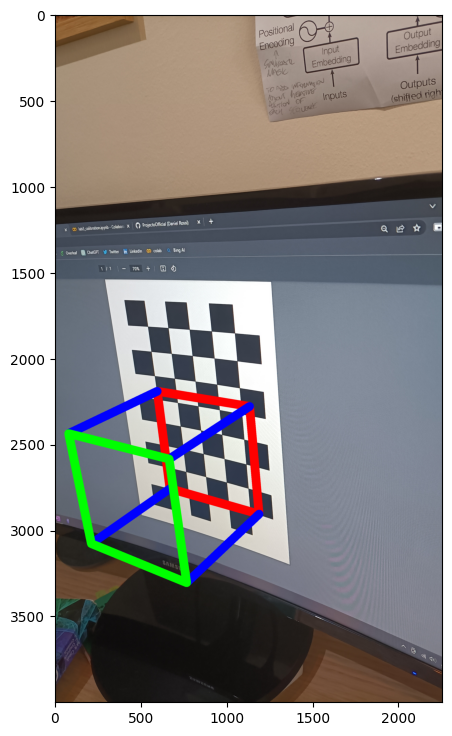

In [132]:
img=cv2.imread(img_names[image_index]) #load the correct image

red=(0,0,255) #red (in BGR)
blue=(255,0,0) #blue (in BGR)
green=(0,255,0) #green (in BGR)
line_width=50

#first draw the base in red
cv2.line(img, tuple(cube_corners_2d[0][0]), tuple(cube_corners_2d[1][0]),red,line_width)
cv2.line(img, tuple(cube_corners_2d[1][0]), tuple(cube_corners_2d[2][0]),red,line_width)
cv2.line(img, tuple(cube_corners_2d[2][0]), tuple(cube_corners_2d[3][0]),red,line_width)
cv2.line(img, tuple(cube_corners_2d[3][0]), tuple(cube_corners_2d[0][0]),red,line_width)

#now draw the pillars
cv2.line(img, tuple(cube_corners_2d[0][0]), tuple(cube_corners_2d[4][0]),blue,line_width)
cv2.line(img, tuple(cube_corners_2d[1][0]), tuple(cube_corners_2d[5][0]),blue,line_width)
cv2.line(img, tuple(cube_corners_2d[2][0]), tuple(cube_corners_2d[6][0]),blue,line_width)
cv2.line(img, tuple(cube_corners_2d[3][0]), tuple(cube_corners_2d[7][0]),blue,line_width)

#finally draw the top
cv2.line(img, tuple(cube_corners_2d[4][0]), tuple(cube_corners_2d[5][0]),green,line_width)
cv2.line(img, tuple(cube_corners_2d[5][0]), tuple(cube_corners_2d[6][0]),green,line_width)
cv2.line(img, tuple(cube_corners_2d[6][0]), tuple(cube_corners_2d[7][0]),green,line_width)
cv2.line(img, tuple(cube_corners_2d[7][0]), tuple(cube_corners_2d[4][0]),green,line_width)
    
plt.figure(figsize=(5,10))
plt.imshow(img[...,::-1])
plt.show()

In [129]:
#pyramid
# define the corners of a 3D pyramid
_3d_corners_pyramid = np.float32([[0,0,0], [0,100,0], [100,100,0], [100,0,0],
 [50,50,-100]]) # the common vertex at the center of the top face

pyramid_corners_2d,_ = cv2.projectPoints(_3d_corners_pyramid,rvecs[image_index],tvecs[image_index],camera_matrix,dist_coefs) 
#the underscore allows to discard the second output parameter (see doc)
pyramid_corners_2d = np.round(pyramid_corners_2d).astype(np.int)
print(cube_corners_2d,0) #the output consists in 8 2-dimensional points


[[[ 668 2759]]

 [[1186 2907]]

 [[1131 2281]]

 [[ 594 2193]]

 [[ 211 3079]]

 [[ 765 3306]]

 [[ 663 2587]]

 [[  79 2439]]] 0


<ipython-input-129-61740793928f>:8: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  pyramid_corners_2d = np.round(pyramid_corners_2d).astype(np.int)


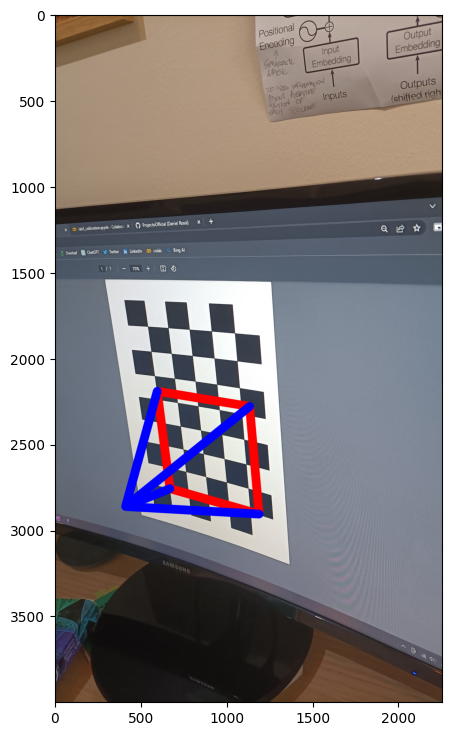

In [133]:
img=cv2.imread(img_names[image_index]) #reload the correct image

line_width=50


#first draw the base in red
cv2.line(img, tuple(pyramid_corners_2d[0][0]), tuple(pyramid_corners_2d[1][0]),red,line_width)
cv2.line(img, tuple(pyramid_corners_2d[1][0]), tuple(pyramid_corners_2d[2][0]),red,line_width)
cv2.line(img, tuple(pyramid_corners_2d[2][0]), tuple(pyramid_corners_2d[3][0]),red,line_width)
cv2.line(img, tuple(pyramid_corners_2d[3][0]), tuple(pyramid_corners_2d[0][0]),red,line_width)




#now draw the pillars
cv2.line(img, tuple(pyramid_corners_2d[0][0]), tuple(pyramid_corners_2d[4][0]),blue,line_width)
cv2.line(img, tuple(pyramid_corners_2d[1][0]), tuple(pyramid_corners_2d[4][0]),blue,line_width)
cv2.line(img, tuple(pyramid_corners_2d[2][0]), tuple(pyramid_corners_2d[4][0]),blue,line_width)
cv2.line(img, tuple(pyramid_corners_2d[3][0]), tuple(pyramid_corners_2d[4][0]),blue,line_width)
                         
                                                
plt.figure(figsize=(5,10))
plt.imshow(img[...,::-1])
plt.show()

## P as Homography

Due to the choice of the WRF associated with calibration images, in each of them we consider only 3D points with z=0. Accordingly, the PPM boils down to a simpler transformation defined by a 3x3 matrix:

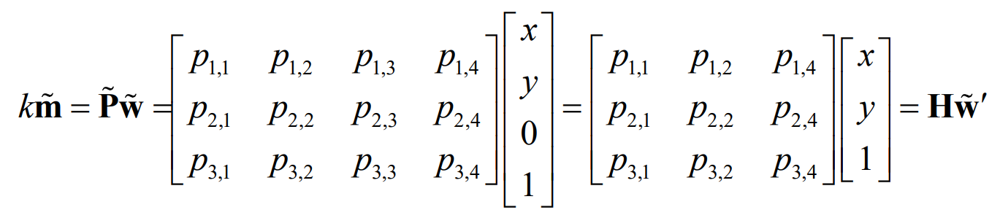
* Such a transformation, denote here as $H$, is known as homography and represents a general linear transformation between planes. Above, $w’$ represents vector $(x; y; 1)$. $H$ can be thought of as a simplification of $P$ in case the imaged object is planar.
* Given a pattern with m corner, we can write m systems of 3 linear equations as above, wherein both 3D as well as 2D coordinates are known due to corners having been detected in the i th image and the unknowns are thus the 9 elements in $H_i$. However, as $H_i$ , and $P_i$ alike, is known up to an arbitrary scale factor, the independent elements in $H_i$ are indeed just 8.

Given a set of corresponding point we may want to find directly find the homography between them. We can do it with

**cv2.findHomography(source_points, destination_points, method)**

Where:
* source_points = set of source points 
* destination_points = set with the corresponding points (same order as source_points)
* method = most used  are method=0 for least square optimazation or 1 for RANSAC.

Otherwise if we have **only 4 points** we can also use:

**cv2.getPerspectiveTransform(source_points, destination_points)**

which calculate the transformation in a closed form using the minimum number of points (8 variable, 4 points with 8 total coordinates). It requires the point in [:,2] shape ignoring the depth = 0 channel.

processing chessboards/chessboards0.jpg


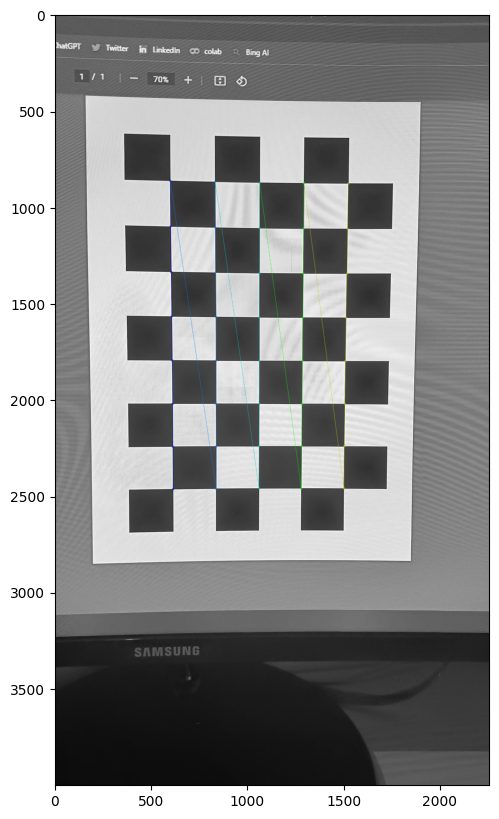

           chessboards/chessboards0.jpg... OK


In [134]:
corners_0 = processImage(img_names[0])

In [135]:
homography = cv2.findHomography(pattern_points[:,:2], corners_0)[0]
print(homography)

[[-2.68814696e-01  9.76839519e+00  6.13920426e+02]
 [-1.01711238e+01  2.55303496e-01  2.46131454e+03]
 [-2.77619578e-04  1.20050711e-04  1.00000000e+00]]


In [136]:
points3D_4 = pattern_points[[0,10,30, 39],:2].astype(np.float32)
points2D_4 = corners_0[[0,10,30, 39],:2].astype(np.float32)

pt = cv2.getPerspectiveTransform(points3D_4,points2D_4)
print(pt)

[[ 6.51617117e+14 -1.30323423e+15  6.11539368e+02]
 [ 3.74703969e+14 -7.49407937e+14  2.46265601e+03]
 [ 4.28399078e+11 -8.56798157e+11  1.00000000e+00]]


## Warping
    
At we did for undistorsion sometimes we know a mapping (e.g homography) between points (e.g. two images) and we would like to warp an image over another.

To apply a perspective transformation we can use:

**cv2.WarpPerspective(src_image, tranformation_matrix, destination_shape)**

If we want to perform the inverse trasformation it is useful **np.linalg.inv(matrix)** which calculates the inverse of a matrix

#Now it's your turn!

## Exercise 0: Calibrate your own camera (or Sample Camera)

Try to reimplement the code explained in the theory. Acquire a set of images with a camera (e.g. your mobile phone camera) and calibrate it. For the calibration target print the chessboard.pdf in a A4 paper.
If you are not able to use a camera use the sample images contained in "calibration_images/*.jpg"

In [149]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

dirname = "chessboards/chessboards"
img_names = [dirname + str(i) + ".jpg" for i in range(13)]

square_size = 26.5 #mm
pattern_size = (8,5) # number of inner corner

#Building 3D points
indices = np.indices(pattern_size, dtype=np.float32)
indices *= square_size
pattern_points = np.zeros([pattern_size[0]*pattern_size[1], 3], np.float32)
print(indices.shape)
print(indices.T.shape)

coords_3D = indices.T.reshape(-1, 2)
pattern_points[:, :2] = coords_3D

def processImage(fn):
    print('processing {}'.format(fn))
    img = cv2.imread(fn, cv2.IMREAD_GRAYSCALE)
    
    if img is None:
        print("Failed to load", fn)
        return None

    # find conrners
    found, corners = cv2.findChessboardCorners(img, pattern_size)

    if found:
        #Refining corner position to subpixel iteratively until criteria  max_count=30 or criteria_eps_error=1 is sutisfied
        term = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_COUNT, 30, 1)
        #Image Corners 
        cv2.cornerSubPix(img, corners, (5, 5), (-1, -1), term)

        
    if not found:
        print('chessboard not found')
        return None

    print('           %s... OK' % fn)
    return corners.reshape(-1, 2)

# Building 2D-3D correspondeces
chessboards = [processImage(fn) for fn in img_names]
chessboards = [x for x in chessboards if x is not None]

obj_points = [] #3D points
img_points = [] #2D points

#build correspondences
for corners in chessboards:
        img_points.append(corners)
        obj_points.append(pattern_points)

# Getting the width and height of the images
h, w = cv2.imread(img_names[0], cv2.IMREAD_GRAYSCALE).shape[:2]

# Calibrating Camera
rms, camera_matrix, dist_coefs, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, (w, h), None, None)

(2, 8, 5)
(5, 8, 2)
processing chessboards/chessboards0.jpg
           chessboards/chessboards0.jpg... OK
processing chessboards/chessboards1.jpg
           chessboards/chessboards1.jpg... OK
processing chessboards/chessboards2.jpg
           chessboards/chessboards2.jpg... OK
processing chessboards/chessboards3.jpg
           chessboards/chessboards3.jpg... OK
processing chessboards/chessboards4.jpg
           chessboards/chessboards4.jpg... OK
processing chessboards/chessboards5.jpg
           chessboards/chessboards5.jpg... OK
processing chessboards/chessboards6.jpg
           chessboards/chessboards6.jpg... OK
processing chessboards/chessboards7.jpg
           chessboards/chessboards7.jpg... OK
processing chessboards/chessboards8.jpg
           chessboards/chessboards8.jpg... OK
processing chessboards/chessboards9.jpg
           chessboards/chessboards9.jpg... OK
processing chessboards/chessboards10.jpg
           chessboards/chessboards10.jpg... OK
processing chessboards/chessboar

## Exercise 1A: 3D-2D correspondence

Using image "chessboards/0.jpg" and the calibration results, find the 2D point correspondent to the 3D point (53, 53, 0) and draw a red circle around it.
Solve the exercise in two different ways:

* Use the OpenCV function cv2.projectPoints(objectPoints, rvec, tvec, cameraMatrix, distCoeffs).
* Do it "manually" using the PPM matrix derived from the calibration parameters obtained in the previous exercise.

In [154]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

#Read the image
img = cv2.imread('chessboards/chessboards0.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Define the 3D point
_3d_point = np.array([[53., 53., 0.]], dtype = np.float32)

# Find 2D correspondences with ProjectPoints function.
# projectPoints already consider distorsion coefficients so no need to undistort the imagebefore
# In case you will use the undistorted image you have to pass newcameramtx instead of camera_matrix
# and np.array([0.,0.,0.,0.,0.]) instaead of dist_coefs because distorsion is 0 in undistorted image

print('Using cv2.projectPoints:')
_2d_point = cv2.projectPoints(_3d_corners,rvecs[image_index],tvecs[image_index],camera_matrix,np.array([0.,0.,0.,0.,0.])) 

_2d_point = np.round(_2d_point).astype(int)
print(_2d_point.dtype)
print("2D point using PPM: ", _2d_point)

# Draw a circle around the point
img1 = np.copy(img)
cv2.circle(img1, (_2d_point[0], _2d_point[1]), 100, (255,0,0), 20)
plt.figure(figsize=(10, 10))
plt.imshow(img1)
plt.show()
'''
# Second way
# First undistort image to make the PPM working better removing the lens distorsion.
# If the lens distorsion is small you shoud not see big differences
# We have to do it since the homography is a linear transformation and cannot remap nonlinear deformations

newcameramtx, roi = cv2.undistort(img, camera_matrix, dist_coefs, None, newcameramtx)
x, y, w_2, h_2 = roi
img_undistorted = im_undistorted[y:y+h_2, x:x+w_2]

# Find the results calcultaing the PPM from A,R and T
print('Using PPM:')
R = 
T = 
A = # We use the undistorted image so we have to change A to the new optimal for the undistorted image

# Building the PPM
PPM = n

# Define the 3D point in homogeneous coordinate in order to multiply with the PPM 
_3d_point_homogeneous = 

# Multiply by the PPM obtaining the pixel in homogeneous coordinate
_2d_point_homogeneous = 

# Divide by the third value to get the pixel coordinate
_2d_point = 
_2d_point = np.round(_2d_point).astype(int)

print("2D point using PPM (Coordinates referred to the undistorted image): ", ( int(round(_2d_point[0,0])), int(round(_2d_point[1,0])) ))

# Draw the point
img2 = np.copy(img_undistorted)
cv2.circle(img2, (_2d_point[0][0], _2d_point[1][0]), 100, (255,0,0), 20)

# Crop away the black region obtained by undistorsion
img2 = img2[y:y+h_2, x:x+w_2]

plt.figure(figsize=(10, 10))
plt.imshow(img2)
plt.show()'''

Using cv2.projectPoints:


TypeError: ignored

## Exercise 1 B:
Find the 3D point correspondent to the 2D point of the (2,2) corner. Do it first using the PPM derived from the calibration parameters and then using a new homography (calculated with cv2.findHomography).

The expected result is approximately (53,53,0).

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

#Read the image
img = cv2.imread('chessboards/0.jpg')
h, w = img.shape[:2]

# First undistort image to make the PPM working better removing the lens distorsion.
# If the lens distorsion is small you shoud not see big differences
# Crop away the black regions only after all the computation 
# because crop change the dimension of the image leading to wrong results
newcameramtx, roi =  cv2.getOptimalNewCameraMatrix(camera_matrix, dist_coefs, (w, h), 1, (w, h))
x, y, w_2, h_2 = roi
img = 

# define chessboard params
square_size = 26.5 #mm
pattern_size = (8,5) # number of inner corner

# build chessboard 3D points
indices = np.indices(pattern_size, dtype=np.float32)
indices *= square_size
pattern_points = np.zeros([pattern_size[0]*pattern_size[1], 3], np.float32)
coords_3D = indices.T.reshape(-1, 2)
pattern_points[:, :2] = coords_3D

# processImage takes the undistorted image in this case
def processImage(img):
    print('processing')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    found, corners = cv2.findChessboardCorners(img, pattern_size)

    if found:
        #Refining corner position to subpixel iteratively until criteria  max_count=30 or criteria_eps_error=1 is sutisfied
        term = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_COUNT, 5, 1)
        #Image Corners 
        cv2.cornerSubPix(img, corners, (5, 5), (-1, -1), term)
        
    if not found:
        print('chessboard not found')
        return None

    print('           ... OK')
    return corners.reshape(-1, 2)

corners = processImage(img)

# Getting the position of corner (2,2)
_2d_point = 
_2d_point_homogeneous = 

# find the homography between 3D points and 2D points
homography = cv2.findHomography(pattern_points, corners, 0)[0]

# use the inverse of the homography to project the 2D point to the 3D point
_3d_point_homogeneous = 

# transform homogeneous coordinates in euclidean coordinates
_3d_point = 

# force the 3D point to be on the chessboard plane
_3d_point[-1] = 0.

_3d_point = _3d_point.reshape([1,3])
print('\nCorresponding 3D point using new homography:', _3d_point[0])

# SECOND WAY: USE THE PPM
# Find the results calculating the PPM from A,R and T
print('Using PPM:')
R = 
T = 
A = newcameramtx # We use the undistorted image so we have to change A to the new optimal for the undistorted image

# Building the PPM
PPM = 

# P as Homography
homography = 

# use the inverse of the homography to project the 2D point to the 3D point
_3d_point_homogeneous = 

# transform homogeneous coordinates in euclidean coordinates
_3d_point = 

# force the 3D point to be on the chessboard plane
_3d_point[-1] = 0.

_3d_point = _3d_point.reshape([1,3])
print('\nCorresponding 3D point using PPM:', _3d_point[0])

## Exercise 2: 3D Measureaments in mm

Take an image with an object belonging to same plane of the chessboard (the chessboard has to be in the image). If you cannot use your camera try on "es2/pen.jpg".

Measure the lenght of that object in mm.
Image coordinates are provided for you

Expected_results: 145.56mm

**Tips (Only if needed)**
* Find the homography given 2D-3D correspondences
* Get the coordinate of two pixels of the object
* Apply the same transformation as in Exercise 1b to get the 3D coordinate of those pixels
* Find the euclidean distance between two 3D points to get your mesuraments

In [ ]:
# Distorsion ignored in this exercise. Try to add the undistorsion in your solution.

image_name = "es2/pen.jpg"
image = cv2.imread(image_name)

square_size = 26.5 #mm
pattern_size = (8,5) # number of inner corner

#Building 3D points
indices = np.indices(pattern_size, dtype=np.float32)
indices *= square_size
pattern_points = np.zeros([pattern_size[0]*pattern_size[1], 3], np.float32)
coords_3D = indices.T.reshape(-1, 2)
pattern_points[:, :2] = coords_3D

def processImage(fn):
    print('processing {}'.format(fn))
    img = cv2.imread(fn, cv2.IMREAD_GRAYSCALE)
    
    if img is None:
        print("Failed to load", fn)
        return None

    found, corners = cv2.findChessboardCorners(img, pattern_size)

    if found:
        #Refining corner position to subpixel iteratively until criteria  max_count=30 or criteria_eps_error=1 is sutisfied
        term = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_COUNT, 5, 1)
        #Image Corners 
        cv2.cornerSubPix(img, corners, (5, 5), (-1, -1), term)
        
    if not found:
        print('chessboard not found')
        return None

    print('           %s... OK' % fn)
    return corners.reshape(-1, 2)

# Building 2D-3D correspondeces
corners = processImage(image_name)

# Finding homography between the two sets of points
homography = cv2.findHomography(pattern_points, corners)[0] #from 3D to 2D

# 2D points A,B
point2D_homogeneous_a = (2722, 1160, 1)
point2D_homogeneous_b = (2686, 2675, 1)

# Find 3D coordinates  
point3D_homogeneous_a = 
point3D_a =
point3D_a[-1] = 0

point3D_homogeneous_b = n
point3D_b = 
point3D_b[-1] = 0

print("2D: ", point2D_homogeneous_a[:-1], point2D_homogeneous_b[:-1])
print("3D: ", point3D_a, point3D_b)

# Drawing line and circles
cv2.circle(image, (point2D_homogeneous_a[0], point2D_homogeneous_a[1]), 100, (0,0,255), 5)
cv2.circle(image, (point2D_homogeneous_b[0], point2D_homogeneous_b[1]), 100, (0,0,255), 5)
cv2.line(image, (point2D_homogeneous_a[0], point2D_homogeneous_a[1]),  (point2D_homogeneous_b[0], point2D_homogeneous_b[1]),(0,255,0),10)

dist = 
print("{:.2f}mm".format(dist))

plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
plt.show()

#At home

## Exercise 3: Augmented Reality 

Given an image, project it on the chessboard to cover all the corners of the image. Try to get restore the values of the original image (the one with the chessboard) instead of black pixels obtained with warping.
Image coordinates are provided for you

Test the algorithm on "chessboard.jpg" and "stregatto.jpg".

**Tips (Only if needed)**
* Find the 4 points in the image where you would like to project the image with the chessboard
* Find the Perspective Transformation
* Warp the image
* Understand what are the points to restore with the original values
* Restore the values in those pixels

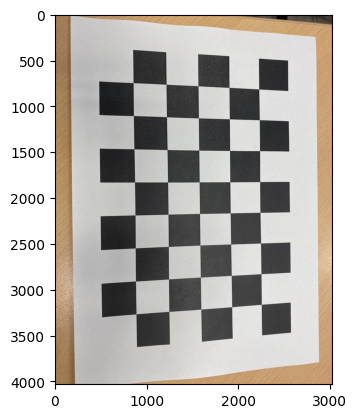

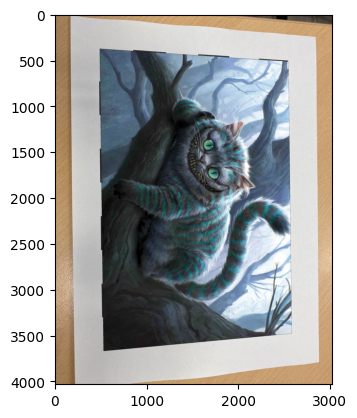

In [167]:
# Distorsion ignored in this exercise. Try to add the undistorsion in your solution.

import numpy as np
import cv2
from matplotlib import pyplot as plt 

image = cv2.imread("es3/chessboard.jpg")
image2project = cv2.imread("es3/stregatto.jpg") 

h, w = image.shape[0], image.shape[1]
h_2, w_2=  image2project.shape[0], image2project.shape[1]

# Coordinate of the chessboard in 0.jpg
rect = np.array([
    [2537, 519],
    [2573, 3480],
    [530, 3670],
    [488, 380]
], dtype = "float32")

# Coordinate of the border of the image we want to project
src = np.array([
 [0, 0],
 [w_2 - 1, 0],
 [w_2 - 1, h_2 - 1],
 [0, h_2 - 1]
], dtype = "float32")

# Compute the perspective transform matrix 
M = cv2.getPerspectiveTransform(src, rect)

# Apply the transformation matrix 
warped = cv2.warpPerspective(image2project, M, (w, h))

# Warp a white mask to understand what are the black pixels
white = np.ones([h_2,w_2,3],dtype=np.uint8)*255
warp_mask = cv2.warpPerspective(white, M, (w, h))
warp_mask = np.equal(warp_mask, np.array([0,0,0]))

# Restore previous values
warped[warp_mask] = image[warp_mask]

# Display original image
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

# Display warped image
plt.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
plt.show()